# Import Dependencies

In [ ]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import seaborn as sns
import pandas as pd
import time
import os
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim

# Global Variables

In [ ]:
# Trajectory Data
TRAJECTORY_DATA_FILENAME = 'trajectory_data_sample1.csv'
# Metrics Data
METRICS_DATA_FILENAME = 'metrics_data_sample1.csv'
# End Effector Positions
END_EFFECTOR_POSITIONS_DATA = 'end_effector_positions_data_sample1.csv'

# Data Exploration

# Visualize End Effector Data

In [ ]:
end_effector_df = pd.read_csv(END_EFFECTOR_POSITIONS_DATA)
end_effector_df.head()

,PairID,Algorithm,X,Y,Z
0,1,RRT,1.55401,-0.045191,0.728940
1,1,RRT,1.55389,-0.045681,0.729443
2,1,RRT,1.55355,-0.047151,0.730952
3,1,RRT,1.55295,-0.049600,0.733469
4,1,RRT,1.55206,-0.053021,0.736999


In [ ]:
def plot_end_effector_paths_side_by_side(df):
    # Create two side-by-side subplots
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=("RRT", "RRT*"),
        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]]
    )

    # Plot for RRT
    for pair_id in df[df['Algorithm'] == 'RRT']['PairID'].unique():
        pair_df = df[(df['PairID'] == pair_id) & (df['Algorithm'] == 'RRT')]
        fig.add_trace(
            go.Scatter3d(
                x=pair_df['X'],
                y=pair_df['Y'],
                z=pair_df['Z'],
                mode='lines',
                line=dict(width=0.5),
                showlegend=False
            ),
            row=1, col=1
        )

    # Plot for RRT*
    for pair_id in df[df['Algorithm'] == 'RRT*']['PairID'].unique():
        pair_df = df[(df['PairID'] == pair_id) & (df['Algorithm'] == 'RRT*')]
        fig.add_trace(
            go.Scatter3d(
                x=pair_df['X'],
                y=pair_df['Y'],
                z=pair_df['Z'],
                mode='lines',
                line=dict(width=0.5),
                showlegend=False
            ),
            row=1, col=2
        )

    # Update layout
    fig.update_layout(
        title="End Effector Paths for RRT and RRT*",
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        scene2=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        margin=dict(l=0, r=0, t=100, b=100),
        height=800
    )



    fig.show()

In [ ]:
plot_end_effector_paths_side_by_side(end_effector_df)

One pair path

In [ ]:
def plot_end_effector_paths_for_pair(df, pair_id):
    fig = go.Figure()

    # Filter the dataframe for the RRT algorithm and the specified pair_id
    rrt_df = df[(df['Algorithm'] == 'RRT') & (df['PairID'] == pair_id)]
    # Filter the dataframe for the RRT* algorithm and the specified pair_id
    rrt_star_df = df[(df['Algorithm'] == 'RRT*') & (df['PairID'] == pair_id)]

    # Plot for RRT
    fig.add_trace(
        go.Scatter3d(
            x=rrt_df['X'],
            y=rrt_df['Y'],
            z=rrt_df['Z'],
            mode='lines',
            line=dict(width=3, color='blue'),  # RRT in blue
            name='RRT'
        )
    )

    # Plot for RRT*
    fig.add_trace(
        go.Scatter3d(
            x=rrt_star_df['X'],
            y=rrt_star_df['Y'],
            z=rrt_star_df['Z'],
            mode='lines',
            line=dict(width=3, color='red'),  # RRT* in red
            name='RRT*'
        )
    )

    # Update layout
    fig.update_layout(
        title=f"End Effector Paths for Pair ID {pair_id}",
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        margin=dict(l=0, r=0, t=100, b=100),
        height=600
    )

    fig.show()

In [ ]:
plot_end_effector_paths_for_pair(end_effector_df, pair_id=15)

# Metrics Data

In [ ]:
metrics_df = pd.read_csv(METRICS_DATA_FILENAME)
metrics_df.head()

,PairID,Algorithm,PlanningTime_ms,ExecutionTime_ms,Smoothness,PathLength
0,1,RRT,101,18043,0.002040,7.28760
1,1,RRT*,5052,25323,0.002430,3.98059
2,2,RRT,56,13264,0.007924,2.53672
3,2,RRT*,5050,10336,0.005160,3.47153
4,3,RRT,53,23126,0.003296,4.29077


Plot the Path Length distribution

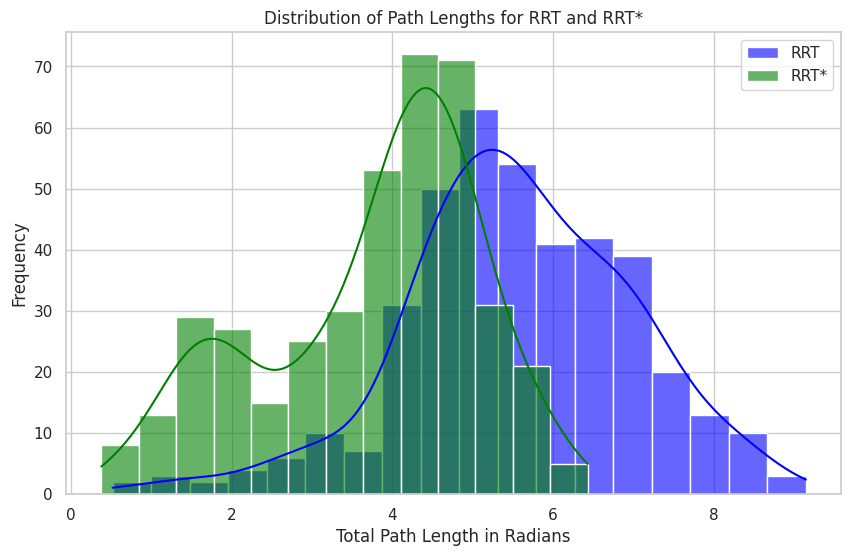

In [ ]:
# Adjust the style for paper publishing
sns.set(style="whitegrid")

# Filter data for RRT and RRT*
rrt_data = metrics_df[metrics_df['Algorithm'] == 'RRT']['PathLength']
rrt_star_data = metrics_df[metrics_df['Algorithm'] == 'RRT*']['PathLength']

# Plotting
plt.figure(figsize=(10, 6))
sns.histplot(rrt_data, color="blue", label="RRT", kde=True, alpha=0.6)
sns.histplot(rrt_star_data, color="green", label="RRT*", kde=True, alpha=0.6)

# Adding legend, title and labels
plt.legend()
plt.title("Distribution of Path Lengths for RRT and RRT*")
plt.xlabel("Total Path Length in Radians")
plt.ylabel("Frequency")

# Saving the plot (optional)
plt.savefig("planning_time_distribution.png", dpi=500)

# Show the plot
plt.show()

Get the path length statistics. Filter bad plans.

In [ ]:
# Pivot the table to get RRT and RRT* side by side for each PairID
pivot_df = metrics_df.pivot(index='PairID', columns='Algorithm', values='PathLength')

# Count how many times RRT* was shorter
times_rrt_star_shorter = (pivot_df['RRT*'] < pivot_df['RRT']).sum()
print(f"Times RRT* was shorter than RRT: {times_rrt_star_shorter/len(pivot_df)*100}")

# Filter out cases where RRT* was longer or equal in path length than RRT
filtered_df = metrics_df[~metrics_df['PairID'].isin(pivot_df[pivot_df['RRT*'] >= pivot_df['RRT']].index)]

# Calculating the mean path length for RRT and RRT*
rrt_mean_path_length = filtered_df[filtered_df['Algorithm'] == 'RRT']['PathLength'].mean()
rrt_star_mean_path_length = filtered_df[filtered_df['Algorithm'] == 'RRT*']['PathLength'].mean()

# Calculating how many times the path length for RRT is more than that for RRT*
times_more = rrt_mean_path_length / rrt_star_mean_path_length

# Print the result
print(f"RRT Average path length {rrt_mean_path_length}")
print(f"RRT* Average path length {rrt_star_mean_path_length}")
print(f"RRT* planning time is {times_more:.1f}x more than RRT planning time.")

Times RRT* was shorter than RRT: 84.5
RRT Average path length 5.876673846153846
RRT* Average path length 3.5650283402366867
RRT* planning time is 1.6x more than RRT planning time.


Smoothness

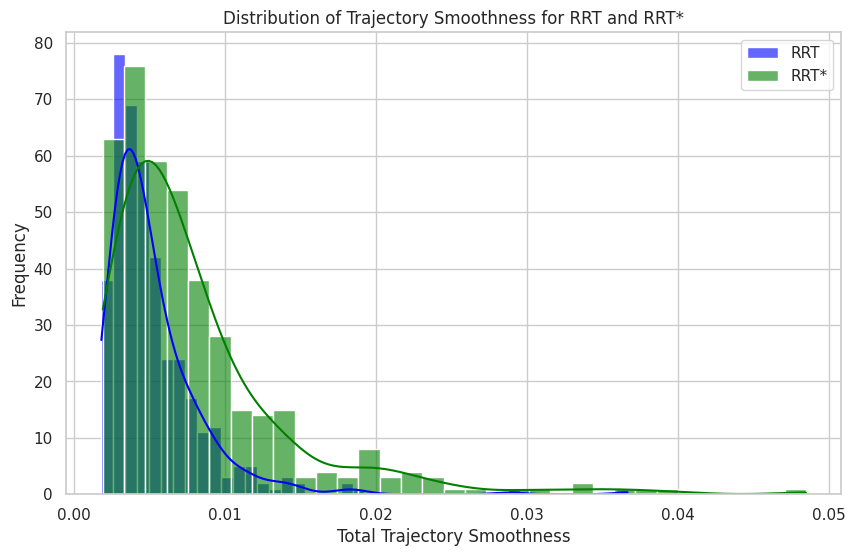

In [ ]:
# Adjust the style for paper publishing
sns.set(style="whitegrid")

# Filter data for RRT and RRT*
rrt_data = metrics_df[metrics_df['Algorithm'] == 'RRT']['Smoothness']
rrt_star_data = metrics_df[metrics_df['Algorithm'] == 'RRT*']['Smoothness']

# Plotting
plt.figure(figsize=(10, 6))
sns.histplot(rrt_data, color="blue", label="RRT", kde=True, alpha=0.6)
sns.histplot(rrt_star_data, color="green", label="RRT*", kde=True, alpha=0.6)

# Adding legend, title and labels
plt.legend()
plt.title("Distribution of Trajectory Smoothness for RRT and RRT*")
plt.xlabel("Total Trajectory Smoothness")
plt.ylabel("Frequency")

# Saving the plot (optional)
plt.savefig("planning_time_distribution.png", dpi=500)

# Show the plot
plt.show()

Planning Time

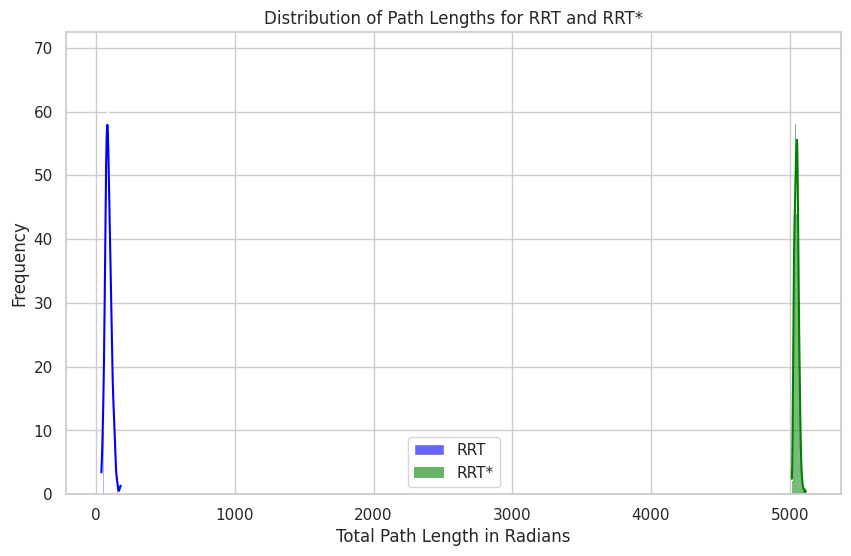

In [ ]:
# Adjust the style for paper publishing
sns.set(style="whitegrid")

# Filter data for RRT and RRT*
rrt_data = metrics_df[metrics_df['Algorithm'] == 'RRT']['PlanningTime_ms']
rrt_star_data = metrics_df[metrics_df['Algorithm'] == 'RRT*']['PlanningTime_ms']

# Plotting
plt.figure(figsize=(10, 6))
sns.histplot(rrt_data, color="blue", label="RRT", kde=True, alpha=0.6)
sns.histplot(rrt_star_data, color="green", label="RRT*", kde=True, alpha=0.6)

# Adding legend, title and labels
plt.legend()
plt.title("Distribution of Path Lengths for RRT and RRT*")
plt.xlabel("Total Path Length in Radians")
plt.ylabel("Frequency")

# Saving the plot (optional)
plt.savefig("planning_time_distribution.png", dpi=500)

# Show the plot
plt.show()

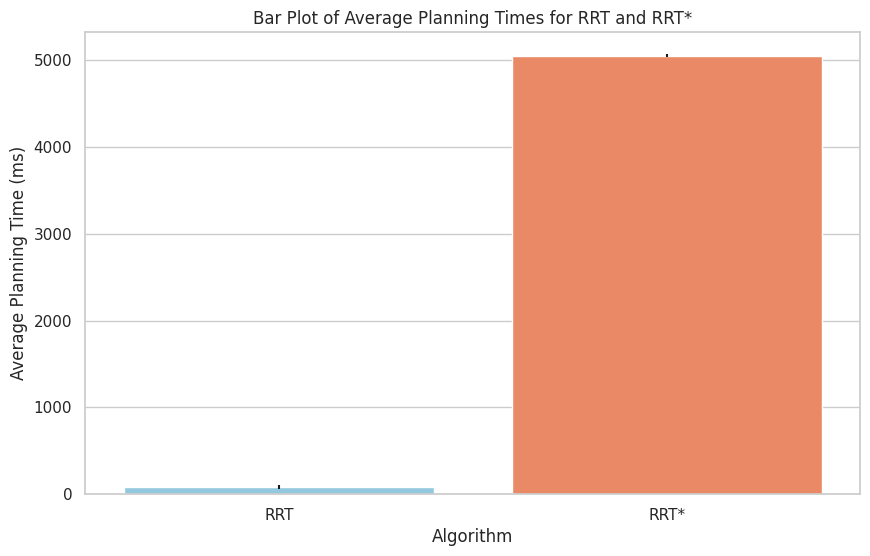

RRT* planning time is 57.6x more than RRT planning time.


In [ ]:
# Assuming metrics_df is your DataFrame and is already loaded with data
sns.set(style="whitegrid")  # Setting the style for the plot

# Calculating mean and standard deviation for the bar plot
bar_plot_data = metrics_df.groupby('Algorithm')['PlanningTime_ms'].agg(['mean', 'std']).reset_index()

# Creating a bar plot with custom colors
plt.figure(figsize=(10, 6))
sns.barplot(
    x='Algorithm',
    y='mean',
    yerr=bar_plot_data['std'],
    data=bar_plot_data,
    palette=['skyblue', 'coral']  # Custom colors for RRT and RRT*
)
plt.title('Bar Plot of Average Planning Times for RRT and RRT*')
plt.xlabel('Algorithm')
plt.ylabel('Average Planning Time (ms)')
plt.show()

# Calculating the mean planning times for RRT and RRT*
rrt_mean_planning_time = metrics_df[metrics_df['Algorithm'] == 'RRT']['PlanningTime_ms'].mean()
rrt_star_mean_planning_time = metrics_df[metrics_df['Algorithm'] == 'RRT*']['PlanningTime_ms'].mean()

# Calculating how many times the planning time for RRT* is more than that for RRT
times_more = rrt_star_mean_planning_time / rrt_mean_planning_time

# Print the result
print(f"RRT* planning time is {times_more:.1f}x more than RRT planning time.")

# Data Preprocessing

## Trajectory Data

Read Trajectory Data

In [ ]:
traj_df = pd.read_csv(TRAJECTORY_DATA_FILENAME)
traj_df.head()

,PairID,Algorithm,Time,Joint1_Position,Joint1_Velocity,Joint1_Acceleration,Joint2_Position,Joint2_Velocity,Joint2_Acceleration,Joint3_Position,...,Joint4_Acceleration,Joint5_Position,Joint5_Velocity,Joint5_Acceleration,Joint6_Position,Joint6_Velocity,Joint6_Acceleration,Joint7_Position,Joint7_Velocity,Joint7_Acceleration
0,1,RRT,0.0,0.321656,0.527207,2.56334,1.51281,0.300186,1.94992,-2.83473,...,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.00,0.00000,0.000000,0.000000,0.000000
1,1,RRT,0.1,0.321485,0.526847,2.56209,1.51230,0.300083,1.94907,-2.83473,...,-0.002066,-0.016973,0.000026,-0.034214,-0.072007,-0.25,-0.10221,-0.020658,-0.169727,0.000264
2,1,RRT,0.2,0.320971,0.525767,2.55834,1.51077,0.299773,1.94652,-2.83473,...,-0.004132,-0.033945,0.000053,-0.034214,-0.072007,-0.25,-0.10221,-0.020658,-0.169727,0.000264
3,1,RRT,0.3,0.320116,0.523967,2.55209,1.50822,0.299257,1.94228,-2.83472,...,-0.006197,-0.050918,0.000079,-0.034214,-0.072007,-0.25,-0.10221,-0.020658,-0.169727,0.000264
4,1,RRT,0.4,0.318919,0.521447,2.54334,1.50464,0.298534,1.93634,-2.83471,...,-0.008263,-0.067891,0.000105,-0.034214,-0.072007,-0.25,-0.10221,-0.020658,-0.169727,0.000264


In [ ]:
traj_df.columns

Index(['PairID', 'Algorithm', 'Time', 'Joint1_Position', 'Joint1_Velocity',
       'Joint1_Acceleration', 'Joint2_Position', 'Joint2_Velocity',
       'Joint2_Acceleration', 'Joint3_Position', 'Joint3_Velocity',
       'Joint3_Acceleration', 'Joint4_Position', 'Joint4_Velocity',
       'Joint4_Acceleration', 'Joint5_Position', 'Joint5_Velocity',
       'Joint5_Acceleration', 'Joint6_Position', 'Joint6_Velocity',
       'Joint6_Acceleration', 'Joint7_Position', 'Joint7_Velocity',
       'Joint7_Acceleration'],
      dtype='object')

Clean Trajectory Data

In [ ]:
traj_df_clean = traj_df[['PairID',
                         'Algorithm',
                         'Time',
                         'Joint1_Position',
                         'Joint2_Position',
                         'Joint3_Position',
                         'Joint4_Position',
                         'Joint5_Position',
                         'Joint6_Position',
                         'Joint7_Position',]]
traj_df_clean.head()

,PairID,Algorithm,Time,Joint1_Position,Joint2_Position,Joint3_Position,Joint4_Position,Joint5_Position,Joint6_Position,Joint7_Position
0,1,RRT,0.0,0.321656,1.51281,-2.83473,-0.000,-0.000000,0.000000,0.000000
1,1,RRT,0.1,0.321485,1.51230,-2.83473,-0.025,-0.016973,-0.072007,-0.020658
2,1,RRT,0.2,0.320971,1.51077,-2.83473,-0.050,-0.033945,-0.072007,-0.020658
3,1,RRT,0.3,0.320116,1.50822,-2.83472,-0.075,-0.050918,-0.072007,-0.020658
4,1,RRT,0.4,0.318919,1.50464,-2.83471,-0.100,-0.067891,-0.072007,-0.020658


Only use trajectories where the PathLength metric of RRT* beat RRT

In [ ]:
# Pivot the metrics DataFrame
pivot_df = metrics_df.pivot(index='PairID', columns='Algorithm', values='PathLength')

# Find PairIDs where RRT* has a shorter path length
shorter_rrt_star_pair_ids = pivot_df[pivot_df['RRT*'] < pivot_df['RRT']].index.tolist()

# Filter traj_df for those PairIDs and create a separate copy
filtered_traj_df = traj_df_clean[traj_df_clean['PairID'].isin(shorter_rrt_star_pair_ids)].copy()

# Factorize the PairID to get a unique ID for each group
filtered_traj_df['PairID'] = pd.factorize(filtered_traj_df['PairID'])[0] + 1  # Adding 1 to start from 1 instead of 0

# Print the unique count of new PairIDs
print(f"We now have {filtered_traj_df['PairID'].nunique()} pairs after resetting PairIDs.")

# Display the first few rows of the modified DataFrame
filtered_traj_df.head()

We now have 338 pairs after resetting PairIDs.


,PairID,Algorithm,Time,Joint1_Position,Joint2_Position,Joint3_Position,Joint4_Position,Joint5_Position,Joint6_Position,Joint7_Position
0,1,RRT,0.0,0.321656,1.51281,-2.83473,-0.000,-0.000000,0.000000,0.000000
1,1,RRT,0.1,0.321485,1.51230,-2.83473,-0.025,-0.016973,-0.072007,-0.020658
2,1,RRT,0.2,0.320971,1.51077,-2.83473,-0.050,-0.033945,-0.072007,-0.020658
3,1,RRT,0.3,0.320116,1.50822,-2.83472,-0.075,-0.050918,-0.072007,-0.020658
4,1,RRT,0.4,0.318919,1.50464,-2.83471,-0.100,-0.067891,-0.072007,-0.020658


Check the trajectory lengths

In [ ]:
# Group by pairid and algorithm then count the number of rows in each group
grouped_trajectories = filtered_traj_df.groupby(['PairID', 'Algorithm']).size().reset_index(name='Count')
grouped_trajectories.head()

,PairID,Algorithm,Count
0,1,RRT,325
1,1,RRT*,209
2,2,RRT,66
3,2,RRT*,31
4,3,RRT,220


Here we can see taht the lengths of trajectories are highly variables. This means that our GAN will need to be able to take a variable number of inputs and a variable number of outputs

In [ ]:
# Get the min and max count for each pair id
min_max_counts = grouped_trajectories.groupby('Algorithm')['Count'].agg(['min', 'max']).reset_index()
min_max_counts

,Algorithm,min,max
0,RRT,66,399
1,RRT*,24,357


Split Data by Algorithm and Group

In [ ]:
# Split by algorithm
rrt_data = filtered_traj_df[filtered_traj_df['Algorithm'] == 'RRT']
rrt_star_data = filtered_traj_df[filtered_traj_df['Algorithm'] == 'RRT*']
# Group by Pair ID
rrt_grouped = rrt_data.groupby('PairID')
rrt_star_grouped = rrt_star_data.groupby('PairID')

Sequence Padding

In [ ]:
# Find the max length sequence
def find_max_length(grouped):
    max_length = 0
    for _, group in grouped:
        length = group.shape[0]
        if length > max_length:
            max_length = length
    return max_length

max_length_rrt = find_max_length(rrt_grouped)
max_length_rrt_star = find_max_length(rrt_star_grouped)
global_max_length = max(max_length_rrt, max_length_rrt_star)
# Or make it custom here!
# global_max_length = 500

def pad_to_length(sequence, max_length, padding_value=0.0):
    # Calculate the number of padding rows needed
    padding_size = max_length - sequence.size(0)

    # Create a padding tensor of the appropriate size
    if padding_size > 0:
        padding = torch.full((padding_size, sequence.size(1)), padding_value)
        padded_sequence = torch.cat([sequence, padding], dim=0)
    else:
        padded_sequence = sequence

    return padded_sequence

def pad_group(grouped, max_length):
    padded_group = {}
    for pair_id, group in grouped:
        sequence = torch.tensor(group.drop(['PairID', 'Algorithm', 'Time'], axis=1).values, dtype=torch.float)
        padded_sequence = pad_to_length(sequence, max_length)
        padded_group[pair_id] = padded_sequence.unsqueeze(0)  # Add batch dimension
    return padded_group

padded_rrt = pad_group(rrt_grouped, global_max_length)
padded_rrt_star = pad_group(rrt_star_grouped, global_max_length)


In [ ]:
print(padded_rrt[5].size())
print(padded_rrt[2].size())
print(padded_rrt[6].size())

torch.Size([1, 399, 7])
torch.Size([1, 399, 7])
torch.Size([1, 399, 7])


Create Input-Output Pairs

In [ ]:
def get_input_output_pairs(rrt_group, rrt_star_group):
    input_output_pairs = []
    for pair_id in rrt_group:
        rrt_traj = rrt_group[pair_id]
        rrt_star_traj = rrt_star_group[pair_id]
        input_output_pairs.append((rrt_traj, rrt_star_traj))
    return input_output_pairs

pairs = get_input_output_pairs(padded_rrt, padded_rrt_star)

In [ ]:
pair_id_test = 1
# RRT Traj
print(pairs[pair_id_test][0].size())
# RRT* Traj
print(pairs[pair_id_test][1].size())

torch.Size([1, 399, 7])
torch.Size([1, 399, 7])


Plotting the Data

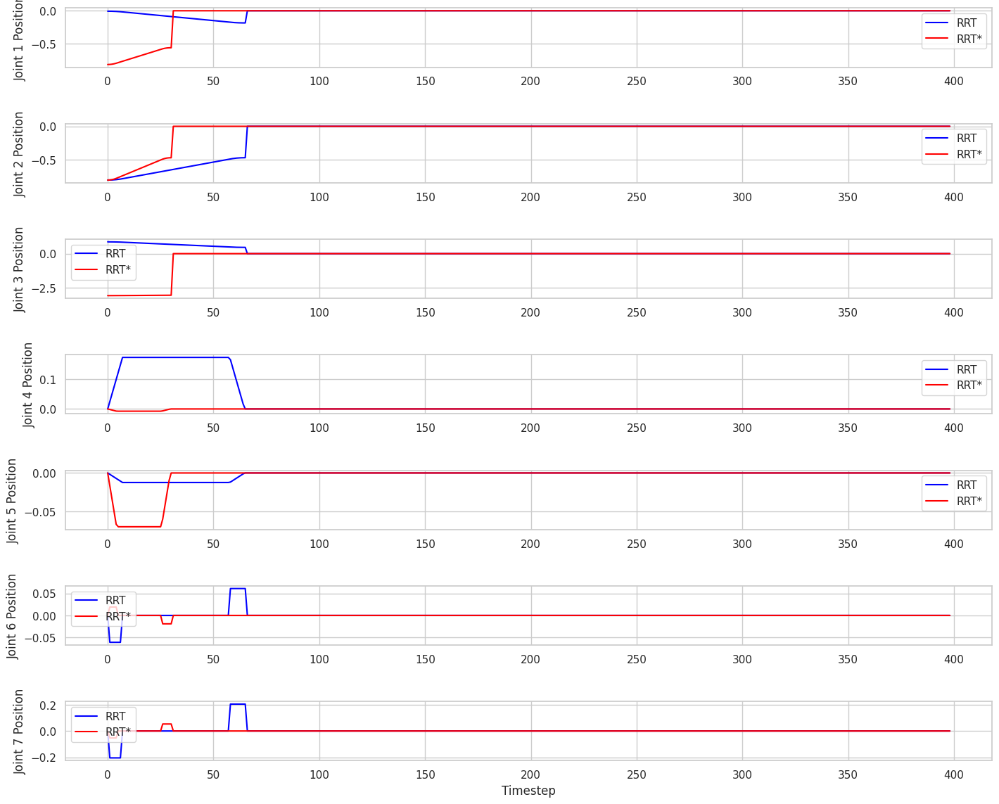

In [ ]:
# Get a pair of data
rrt_traj, rrt_star_traj = pairs[1]

# Convert to numpy for easier handling
rrt_traj_np = rrt_traj.numpy().squeeze()
rrt_star_traj_np = rrt_star_traj.numpy().squeeze()

# Assuming each trajectory has shape [1, time_steps, num_joints]
num_joints = rrt_traj_np.shape[1]
time_steps = range(rrt_traj_np.shape[0])

plt.figure(figsize=(15, 12))

for i in range(num_joints):
    plt.subplot(num_joints, 1, i + 1)
    plt.plot(time_steps, rrt_traj_np[:, i], label='RRT', color='blue')
    plt.plot(time_steps, rrt_star_traj_np[:, i], label='RRT*', color='red')
    plt.ylabel(f'Joint {i+1} Position')
    plt.legend()
    plt.tight_layout(pad=3.0)  # Add padding between plots

plt.xlabel('Timestep')
plt.savefig('rrt_rrtstar_joint_positions.png', dpi=500)
plt.show()

# GAN Architecture

In [ ]:
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size, n_layers, dropout_prob=0.5):
        super(Generator, self).__init__()

        self.lstm1 = nn.LSTM(input_size, hidden_dim, n_layers,
                             batch_first=True, dropout=dropout_prob)
        self.lstm2 = nn.LSTM(hidden_dim, hidden_dim, n_layers,
                             batch_first=True, dropout=dropout_prob)

        self.batch_norm = nn.BatchNorm1d(hidden_dim)

        self.linear1 = nn.Linear(hidden_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.linear2 = nn.Linear(hidden_dim, output_size)

    def forward(self, x):
        x, _ = self.lstm1(x)
        x, _ = self.lstm2(x)

        # Dynamically handle sequence length
        batch_size, seq_len, _ = x.size()

        # Reshape for batch norm
        x = x.contiguous().view(-1, x.size(2))
        x = self.batch_norm(x)

        # Linear layers
        x = self.linear1(x)
        x = self.relu(x)
        x = self.linear2(x)

        # Reshape back to original sequence format
        x = x.view(batch_size, seq_len, -1)
        return x

Test the generator

In [ ]:
# Initialize the generator
generator = Generator(input_size=7, hidden_dim=128, output_size=7, n_layers=2, dropout_prob=0.3)

# Sample input with 250 timesteps
sample_trajectory = torch.randn(1, 250, 7)

# Pass the sample through the generator
with torch.no_grad():
    generated_trajectory = generator(sample_trajectory)

# Generates a sequence of the same squence length length
print("Generated trajectory shape:", generated_trajectory.shape)

Generated trajectory shape: torch.Size([1, 250, 7])


Generator Loss Function

In [ ]:
# Weighting factor for L1 loss
LAMBDA = 100

# Binary Cross-Entropy Loss
def gan_loss(predictions, target_is_real):
    target = torch.ones_like(predictions) if target_is_real else torch.zeros_like(predictions)
    loss = F.binary_cross_entropy_with_logits(predictions, target)
    return loss

# Generator Loss
def generator_loss(disc_generated_output, gen_output, target):
    # GAN loss to evaluate if discriminator was successful in finding the fake data
    gan_loss_val = gan_loss(disc_generated_output, True)

    # L1 loss to make generated output more similar to target
    l1_loss_val = F.l1_loss(gen_output, target)

    # Total generator loss
    total_gen_loss = gan_loss_val + (LAMBDA * l1_loss_val)

    return total_gen_loss, gan_loss_val, l1_loss_val

Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim, n_layers, segment_length):
        super(Discriminator, self).__init__()
        self.segment_length = segment_length
        self.lstm = nn.LSTM(input_size * 2, hidden_dim, n_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, rrt_seq, rrt_star_seq):
        combined_seq = torch.cat((rrt_seq, rrt_star_seq), dim=2)
        segments = self.create_segments(combined_seq)
        num_segments = len(segments)
        segment_outputs = torch.zeros((combined_seq.size(0), num_segments, 1), device=combined_seq.device)

        for i, segment in enumerate(segments):
            x, _ = self.lstm(segment)
            x = self.fc(x[:, -1, :])  # Using the output of the last time step of each segment
            segment_outputs[:, i, :] = x

        # Average the outputs of all segments
        final_output = torch.mean(segment_outputs, dim=1)
        return self.sigmoid(final_output)

    def create_segments(self, sequence):
        batch_size, total_length, features = sequence.shape
        segments = []

        for start in range(0, total_length - self.segment_length + 1, self.segment_length // 2):
            end = start + self.segment_length
            if end > total_length:
                break
            segments.append(sequence[:, start:end, :])

        return segments


Test the discriminator

In [ ]:
# Example initialization
discriminator = Discriminator(input_size=14, hidden_dim=128, n_layers=2, segment_length=20)

# Example test
rrt_sample = torch.randn(1, 190, 7)  # Sample RRT trajectory
rrt_star_sample = torch.randn(1, 190, 7)  # Sample RRT* trajectory

with torch.no_grad():
    disc_output = discriminator(rrt_sample, rrt_star_sample)
    print("Discriminator output:", disc_output)


Discriminator output: tensor([[0.5131]])


Discriminator Loss

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
    # Loss for correctly classifying real data as real
    real_loss = F.binary_cross_entropy_with_logits(disc_real_output, torch.ones_like(disc_real_output))

    # Loss for correctly classifying generated data as fake
    generated_loss = F.binary_cross_entropy_with_logits(disc_generated_output, torch.zeros_like(disc_generated_output))

    # Total loss is the sum of the above two losses
    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

Training loop

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/GAN_experiment

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# Hyperparameters
input_size = 7
hidden_dim = 128
output_size = 7
n_layers = 2
learning_rate = 0.0002
batch_size = 16
epochs = 1000

# Make Data Loader
class TrajectoryDataset(Dataset):
    def __init__(self, pairs):
        self.pairs = pairs

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        rrt_traj, rrt_star_traj = self.pairs[idx]
        return rrt_traj, rrt_star_traj

# Convert pairs to a Dataset
trajectory_dataset = TrajectoryDataset(pairs)

# Create a DataLoader with a smaller batch size
dataloader = DataLoader(trajectory_dataset, batch_size=batch_size, shuffle=True)


# Initialize models
generator = Generator(input_size, hidden_dim, output_size, n_layers)
discriminator = Discriminator(input_size * 2, hidden_dim, n_layers, segment_length=20)

# Optimizers
g_optimizer = optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

# TensorBoard setup
log_dir = 'runs/GAN_experiment'
os.makedirs(log_dir, exist_ok=True)
writer = SummaryWriter(log_dir)

# Checkpointing functions
def save_checkpoint(model, optimizer, filename):
    checkpoint = {
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, filename)

# Training loop
def train(generator, discriminator, g_optimizer, d_optimizer, dataloader, epochs, writer):
    step = 0
    for epoch in range(epochs):
        for rrt_traj, rrt_star_traj in dataloader:
            # Check and reshape inputs if necessary: [batchsize, seq_siz, features]
            if rrt_traj.dim() == 4:
                rrt_traj = rrt_traj.squeeze(1)
            if rrt_star_traj.dim() == 4:
                rrt_star_traj = rrt_star_traj.squeeze(1)

            # Train Discriminator
            fake_rrt_star = generator(rrt_traj)
            disc_real_output = discriminator(rrt_traj, rrt_star_traj)
            disc_generated_output = discriminator(rrt_traj, fake_rrt_star.detach())
            d_loss = discriminator_loss(disc_real_output, disc_generated_output)
            d_optimizer.zero_grad()
            d_loss.backward()
            d_optimizer.step()

            # Train Generator
            disc_generated_output = discriminator(rrt_traj, fake_rrt_star)
            g_total_loss, g_gan_loss, g_l1_loss = generator_loss(disc_generated_output, fake_rrt_star, rrt_star_traj)
            g_optimizer.zero_grad()
            g_total_loss.backward()
            g_optimizer.step()

            if step % 100 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Step {step}, G Total Loss: {g_total_loss.item()}, D Loss: {d_loss.item()}")
                writer.add_scalar('Generator Total Loss', g_total_loss.item(), global_step=step)
                writer.add_scalar('Discriminator Loss', d_loss.item(), global_step=step)
                writer.add_scalar('Generator GAN Loss', g_gan_loss.item(), global_step=step)
                writer.add_scalar('Generator L1 Loss', g_l1_loss.item(), global_step=step)

            # Save checkpoints
            if step % 1000 == 0:
                save_checkpoint(generator, g_optimizer, 'generator_checkpoint.pth')
                save_checkpoint(discriminator, d_optimizer, 'discriminator_checkpoint.pth')

            step += 1

# Assuming dataloader is already defined and set up
train(generator, discriminator, g_optimizer, d_optimizer, dataloader, epochs, writer)


Epoch [1/1000], Step 0, G Total Loss: 36.964027404785156, D Loss: 1.4484716653823853
Epoch [5/1000], Step 100, G Total Loss: 21.350797653198242, D Loss: 1.3288391828536987
Epoch [10/1000], Step 200, G Total Loss: 20.65754508972168, D Loss: 1.182363510131836
Epoch [14/1000], Step 300, G Total Loss: 21.720413208007812, D Loss: 1.0724472999572754
Epoch [19/1000], Step 400, G Total Loss: 19.424034118652344, D Loss: 1.091303825378418
Epoch [23/1000], Step 500, G Total Loss: 18.70194435119629, D Loss: 1.0907915830612183
Epoch [28/1000], Step 600, G Total Loss: 18.577909469604492, D Loss: 1.0952402353286743
Epoch [32/1000], Step 700, G Total Loss: 15.106139183044434, D Loss: 1.0808897018432617
Epoch [37/1000], Step 800, G Total Loss: 17.40970802307129, D Loss: 1.0647587776184082
Epoch [41/1000], Step 900, G Total Loss: 19.678319931030273, D Loss: 1.0220372676849365
Epoch [46/1000], Step 1000, G Total Loss: 20.113710403442383, D Loss: 1.0479295253753662
Epoch [51/1000], Step 1100, G Total Loss